<a href="https://colab.research.google.com/github/a60ese/22.01.85.0011/blob/main/Agus_22_01_85_0011.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://towardsdatascience.com/pycaret-and-streamlit-how-to-create-and-deploy-data-science-web-app-273d205271a3


In [40]:
import pandas as pd
import numpy as np

In [5]:
wine_df = pd.read_csv('/content/CallCenterData.csv')

In [6]:
wine_df.head()

,Index,Incoming Calls,Answered Calls,Answer Rate,Abandoned Calls,Answer Speed (AVG),Talk Duration (AVG),Waiting Time (AVG),Service Level (20 Seconds)
0,1,217,204,94.01%,13,0:00:17,0:02:14,0:02:45,76.28%
1,2,200,182,91.00%,18,0:00:20,0:02:22,0:06:55,72.73%
2,3,216,198,91.67%,18,0:00:18,0:02:38,0:03:50,74.30%
3,4,155,145,93.55%,10,0:00:15,0:02:29,0:03:12,79.61%
4,5,37,37,100.00%,0,0:00:03,0:02:06,0:00:35,97.30%


In [7]:
!pip install -U https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

!pip install -U pandas-profiling

import pandas_profiling as pp
from pandas_profiling import ProfileReport

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip (22.0 MB)
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [8]:
from pandas_profiling import ProfileReport

In [9]:
import pandas_profiling as pp 

In [10]:
profile = pp.ProfileReport(wine_df) 
profile.to_file("output.html")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
profile = ProfileReport(wine_df, title="Pandas Profiling Report", explorative=True)

In [12]:
profile.to_widgets()

/usr/local/lib/python3.7/dist-packages/pandas_profiling/profile_report.py:426: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  "Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60)."


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
pip install pycaret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [17]:
pip install  Jinja2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [18]:
data = wine_df.sample(frac=0.9, random_state=786)
data_unseen = wine_df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (179, 9)
Unseen Data For Predictions: (20, 9)


In [19]:
from pycaret.classification import *

In [42]:
exp_clf01 = setup(data = data, target = 'Abandoned Calls', session_id = 123)

,Description,Value
0,session_id,123
1,Target,Abandoned Calls
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(179, 9)"
5,Missing Values,False
6,Numeric Features,3
7,Categorical Features,2
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[],
                                      target='Abandoned Calls',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numer...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', '

In [43]:
best = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.3308,0.0,0.2907,0.2660,0.2800,0.2612,0.2773,0.479
et,Extra Trees Classifier,0.3205,0.0,0.2811,0.2500,0.2625,0.2454,0.2656,0.468
gbc,Gradient Boosting Classifier,0.3045,0.0,0.2483,0.2207,0.2275,0.2080,0.2830,2.232
dt,Decision Tree Classifier,0.2494,0.0,0.2017,0.1987,0.2139,0.1819,0.1920,0.018
lr,Logistic Regression,0.2404,0.0,0.1902,0.1904,0.1935,0.1564,0.1722,1.103
ridge,Ridge Classifier,0.2404,0.0,0.2156,0.1753,0.1905,0.1458,0.1663,0.018
ada,Ada Boost Classifier,0.2244,0.0,0.1858,0.1156,0.1300,0.1110,0.2467,0.113
knn,K Neighbors Classifier,0.2006,0.0,0.1709,0.1303,0.1481,0.1196,0.1281,0.119
nb,Naive Bayes,0.1769,0.0,0.1334,0.1957,0.1803,0.1475,0.1719,0.022
lda,Linear Discriminant Analysis,0.1744,0.0,0.1254,0.1588,0.1446,0.1033,0.1115,0.027


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 2
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)
INFO:logs:compare_models() succesfully completed......................................


In [44]:
exp_clf102 = setup(data = data, target = 'Abandoned Calls',session_id=123, normalize = True, transformation = True)

,Description,Value
0,session_id,123
1,Target,Abandoned Calls
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(179, 9)"
5,Missing Values,False
6,Numeric Features,3
7,Categorical Features,2
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[],
                                      target='Abandoned Calls',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numer...
                                                  target='Abandoned Calls')),
                ('binn', 'passthrough'), ('rem_outliers',

In [45]:
knn_model=create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.1538,0.0,0.1154,0.1154,0.1282,0.0654,0.0686
1,0.2308,0.0,0.1923,0.2692,0.2308,0.1613,0.1678
2,0.1538,0.0,0.0769,0.1538,0.1538,0.0714,0.0738
3,0.1538,0.0,0.0909,0.1538,0.1538,0.0467,0.0483
4,0.3846,0.0,0.3846,0.2846,0.3077,0.3333,0.3620
5,0.1667,0.0,0.1667,0.1042,0.1167,0.0840,0.0896
6,0.2500,0.0,0.2500,0.2708,0.2278,0.1429,0.1591
7,0.1667,0.0,0.1667,0.1250,0.1389,0.0977,0.1058
8,0.1667,0.0,0.1250,0.1250,0.1389,0.0840,0.0881


INFO:logs:create_model_container: 1
INFO:logs:master_model_container: 1
INFO:logs:display_container: 2
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:create_model() succesfully completed......................................


In [46]:
evaluate_model(knn_model)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

<Figure size 576x396 with 0 Axes>

In [47]:
predict_model(knn_model)

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform'), probability_threshold=None, encoded_labels=False, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.CLASSIFICATION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,K Neighbors Classifier,0.2778,0,0.2118,0.1948,0.2159,0.2101,0.2221


,Index,Answered Calls,Answer Rate_100.00%,Answer Rate_90.36%,Answer Rate_90.70%,Answer Rate_91.32%,Answer Rate_91.43%,Answer Rate_91.79%,Answer Rate_91.86%,Answer Rate_92.60%,...,Talk Duration (AVG)_weekday_2,Talk Duration (AVG)_is_month_end_0,Talk Duration (AVG)_is_month_start_0,Waiting Time (AVG)_month_10,Waiting Time (AVG)_weekday_2,Waiting Time (AVG)_is_month_end_0,Waiting Time (AVG)_is_month_start_0,Abandoned Calls,Label,Score
0,-0.861336,0.543993,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0,0,0.4
1,-0.794019,0.332097,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3,1,0.2
2,0.196111,0.482086,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,5,3,0.4
3,-1.179839,-1.338402,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2,1,0.2
4,-0.438859,0.800657,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,10,1,0.2
5,-0.945348,-1.223744,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2,1,0.2
6,0.126788,-1.598652,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0,0,0.8
7,0.984983,-1.832460,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0,0,1.0
8,-1.695670,0.382325,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,18,18,0.4
9,-1.146404,0.407350,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,10,7,0.4


In [48]:
save_model(knn_model, model_name = 'knn_model')

INFO:logs:Initializing save_model()
INFO:logs:save_model(model=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform'), model_name=knn_model, prep_pipe_=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[],
                                      target='Abandoned Calls',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
       

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[],
                                       target='Abandoned Calls',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numer...
                 ('fix_perfect', Remove_100(target='Abandoned Calls')),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 

In [49]:
dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.0769,0.0,0.0769,0.0769,0.0769,0.0250,0.0287
1,0.2308,0.0,0.2083,0.1923,0.2051,0.1503,0.1600
2,0.2308,0.0,0.1000,0.2308,0.2308,0.1667,0.1722
3,0.1538,0.0,0.0769,0.1538,0.1538,0.0592,0.0617
4,0.3077,0.0,0.3333,0.2500,0.2615,0.2403,0.2520
5,0.2500,0.0,0.2308,0.1944,0.2083,0.1756,0.1857
6,0.2500,0.0,0.1333,0.1944,0.2167,0.1940,0.2064
7,0.4167,0.0,0.4500,0.2917,0.3306,0.3488,0.3662
8,0.2500,0.0,0.1923,0.1875,0.2000,0.1818,0.1938


INFO:logs:create_model_container: 2
INFO:logs:master_model_container: 2
INFO:logs:display_container: 4
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:create_model() succesfully completed......................................


In [50]:
tuned_dt = tune_model(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.2308,0.0,0.2500,0.1154,0.1385,0.1613,0.1778
1,0.2308,0.0,0.2083,0.2051,0.2154,0.1503,0.1600
2,0.3077,0.0,0.1923,0.2564,0.2692,0.2403,0.2484
3,0.1538,0.0,0.0909,0.1538,0.1538,0.0467,0.0490
4,0.3077,0.0,0.3333,0.1923,0.2143,0.2452,0.2795
5,0.1667,0.0,0.1667,0.1111,0.1250,0.0909,0.0986
6,0.2500,0.0,0.2083,0.1583,0.1865,0.1692,0.1871
7,0.4167,0.0,0.4500,0.2778,0.3194,0.3438,0.3675
8,0.4167,0.0,0.3636,0.2333,0.2897,0.3386,0.3629


INFO:logs:create_model_container: 3
INFO:logs:master_model_container: 3
INFO:logs:display_container: 5
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.0001, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:tune_model() succesfully completed......................................


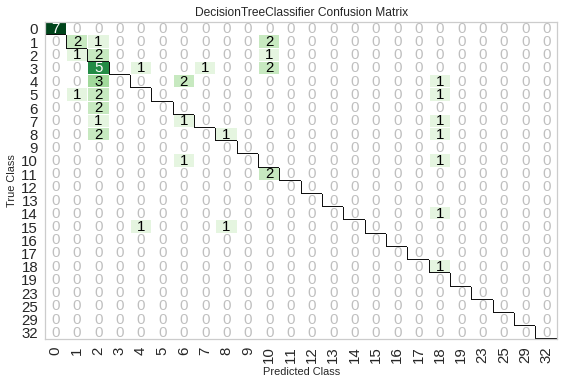

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [51]:
plot_model(tuned_dt, plot = 'confusion_matrix')

In [54]:
plot_model(tuned_dt, plot = 'class_report')

INFO:logs:Initializing plot_model()
INFO:logs:plot_model(fold=None, use_train_data=False, verbose=True, is_in_evaluate=False, display=None, display_format=None, estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.0001, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best'), feature_name=None, fit_kwargs=None, groups=None, label=False, plot=class_report, plot_kwargs=None, save=False, scale=1, system=True)
INFO:logs:Checking exceptions
INFO:logs:Preparing display monitor


IntProgress(value=0, description='Processing: ', max=5)

INFO:logs:Preloading libraries
INFO:logs:Copying training dataset
INFO:logs:Copying test dataset
INFO:logs:Plot type: class_report
INFO:logs:Initializing get_config()
INFO:logs:get_config(variable=prep_pipe)
INFO:logs:Global variable: prep_pipe returned as Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[],
                                      target='Abandoned Calls',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                

KeyError: ignored

<Figure size 576x396 with 0 Axes>

INFO:logs:Initializing plot_model()
INFO:logs:plot_model(fold=None, use_train_data=False, verbose=True, is_in_evaluate=False, display=None, display_format=None, estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.0001, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best'), feature_name=None, fit_kwargs=None, groups=None, label=False, plot=boundary, plot_kwargs=None, save=False, scale=1, system=True)
INFO:logs:Checking exceptions
INFO:logs:Preparing display monitor


IntProgress(value=0, description='Processing: ', max=5)

INFO:logs:Preloading libraries
INFO:logs:Copying training dataset
INFO:logs:Copying test dataset
INFO:logs:Plot type: boundary
INFO:logs:Fitting StandardScaler()
INFO:logs:Fitting PCA()
INFO:logs:Initializing get_config()
INFO:logs:get_config(variable=prep_pipe)
INFO:logs:Global variable: prep_pipe returned as Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[],
                                      target='Abandoned Calls',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill

KeyError: ignored

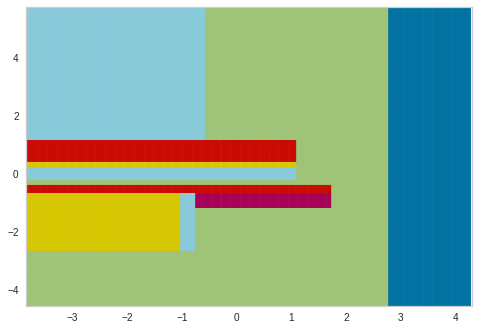

In [55]:
plot_model(tuned_dt, plot='boundary')

INFO:logs:Initializing plot_model()
INFO:logs:plot_model(fold=None, use_train_data=False, verbose=True, is_in_evaluate=False, display=None, display_format=None, estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.0001, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best'), feature_name=None, fit_kwargs=None, groups=None, label=False, plot=error, plot_kwargs=None, save=False, scale=1, system=True)
INFO:logs:Checking exceptions
INFO:logs:Preparing display monitor


IntProgress(value=0, description='Processing: ', max=5)

INFO:logs:Preloading libraries
INFO:logs:Copying training dataset
INFO:logs:Copying test dataset
INFO:logs:Plot type: error
INFO:logs:Initializing get_config()
INFO:logs:get_config(variable=prep_pipe)
INFO:logs:Global variable: prep_pipe returned as Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[],
                                      target='Abandoned Calls',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numer..

YellowbrickValueError: ignored

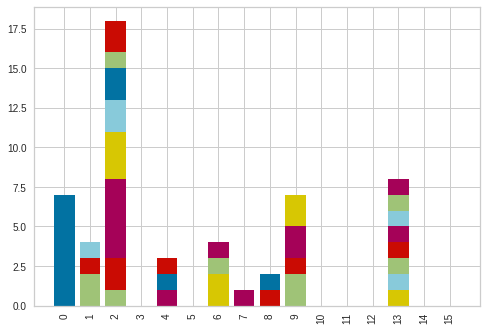

In [56]:
plot_model(tuned_dt, plot = 'error')

In [57]:
evaluate_model(tuned_dt)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.0001, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [58]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 569 kB 8.8 MB/s 


INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best'), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


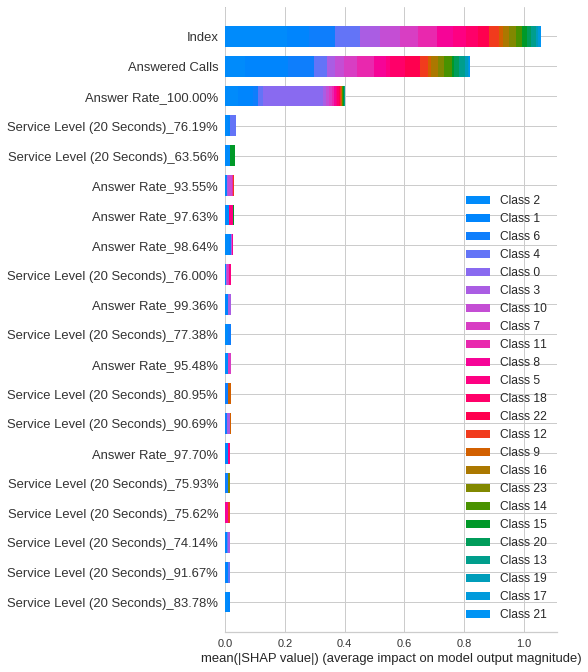

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [59]:
interpret_model(dt)